# HRV EDA

In [54]:
import importlib
import project_utils.deciles as deciles
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from general_utils import utils
from general_utils.OverallDetailComparisonPlot import OverallDetailComparisonPlot
import os

utils.default_plot_format()
utils.pd_display_settings(3)

Predefine where data is and where the plotly images will be saved

In [55]:
#data_path = r'processed_data\5min_nabian_2025_03_03.pkl'
data_path = r"processed_data\raw_metrics\processed_10min_Nabian.pkl"
#data_path = "processed_data/manual_10min_2025_03_03.pkl"
#data_path = r'processed_data\raw_metrics\optimized_20min_Nabian.pkl'
title_addon = " (5 min segments)"

In [56]:
pickled = pd.read_pickle(data_path)
data = pickled["data"]
indicator_columns = pickled["indicator_columns"]
time_metrics = pickled["time_metrics"]
frequency_metrics = pickled["frequency_metrics"]
non_linear_metrics = pickled["non_linear_metrics"]
data.tail()

,t_start,t_end,SDRR,RMSSD,pNN50 (%),Mean HR (bpm),ULF Power,ULF Peak Frequency,ULF Peak Power,VLF Power,...,UCr (g),UACR (mg÷g),Complications,Nephropathy,Retinopathy and cataract,DPN,Heart Disease,atherosclerosis or stenosis,Carotid Plaque,Condition
3250,22212,22812,30.89,24.63,3.13,79.80,2.35e-08,0,1.61e-05,4.24e-06,...,7.26,2.88,1,1,0,True,0,0,1,DPN
3251,21611,22211,40.47,34.10,13.03,77.50,1.07e-08,0,9.96e-06,2.39e-06,...,7.26,2.88,1,1,0,True,0,0,1,DPN
3252,21010,21610,38.71,41.98,27.34,75.71,1.28e-09,0.00167,1.49e-06,3.11e-06,...,7.26,2.88,1,1,0,True,0,0,1,DPN
3253,34218,34818,88.51,31.71,12.61,79.37,1.33e-08,0.00167,1.59e-05,3.19e-06,...,7.26,2.88,1,1,0,True,0,0,1,DPN
3254,76304,76903,173.75,220.18,22.22,74.74,3.17e-09,0.00167,3.57e-06,1.2e-06,...,10.23,0.43,1,0,0,True,0,0,1,DPN


# Median only comparison:
We first derive median of each metric and put them into a single df

In [57]:
def produce_median_melt(data):
    median_df = data.groupby(['id', 'DPN'])[indicator_columns].median()
    median_df = median_df.reset_index()


    median_melted = pd.melt(
        median_df, 
        id_vars=['id', 'DPN'], 
        value_vars=indicator_columns,
        var_name='metric', 
        value_name='value'
    ).reset_index(drop=True)

    return median_melted

median_melted = produce_median_melt(data)

median_melted.tail(3)

,id,DPN,metric,value
517,38,True,D2,-2.16
518,39,True,D2,-3.26
519,40,True,D2,-2.75


In [58]:
from general_utils import CorrectedMultivariableTest as CMT

importlib.reload(CMT)


test = CMT.CorrectedMultivariableTest(
    data=median_melted, 
    group_col='metric',
    value_col='value',
    cat_col='DPN',
    cat_val_1=False,
    cat_val_2=True
)


result = test.perform_ManWhitney_U_tests()
result.sort_values('p_value', inplace=True)
display(result)
result.reset_index(inplace=True, drop=False)

,U_statistic,p_value,significant,rank,BH_threshold,BH_Significant
metric,,,,,,
HF Power,80,0.00709,True,20,0.05,True
LF Power,76,0.0207,True,19,0.0475,True
SDRR,74,0.0322,True,17,0.0425,True
SD2,74,0.0322,True,18,0.045,True
S,73,0.0395,True,16,0.04,True
SD1,71,0.0577,False,15,0.0375,False
RMSSD,71,0.0577,False,14,0.035,False
Mean HR (bpm),18,0.0689,False,13,0.0325,False
pNN50 (%),69,0.0815,False,12,0.03,False


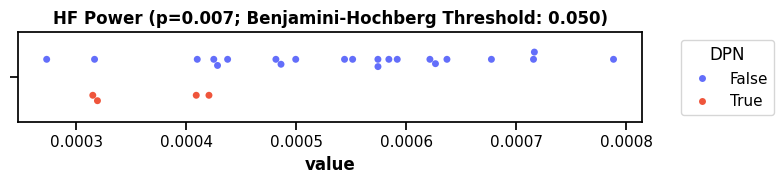

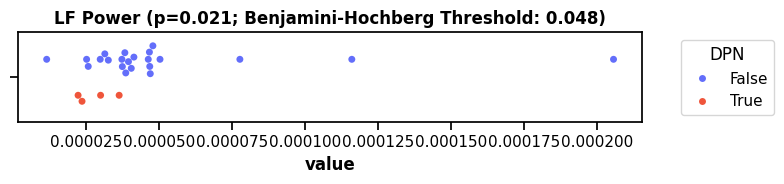

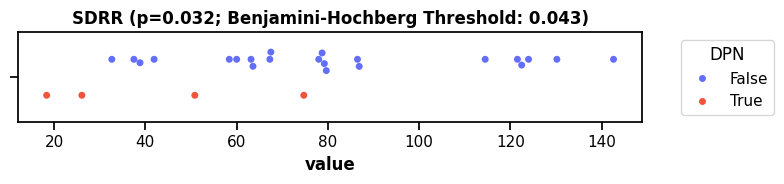

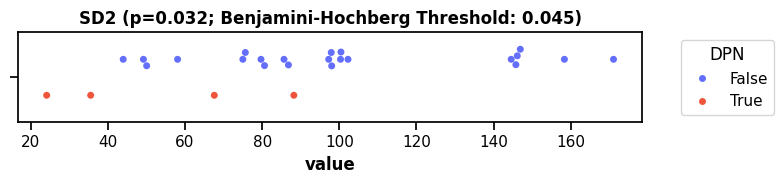

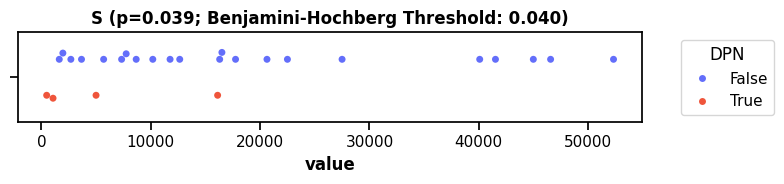

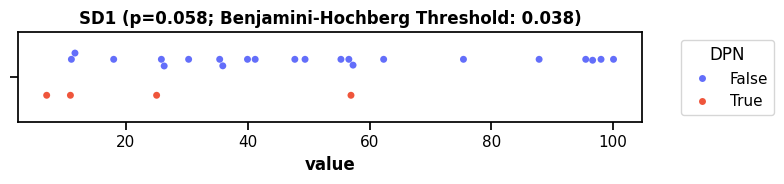

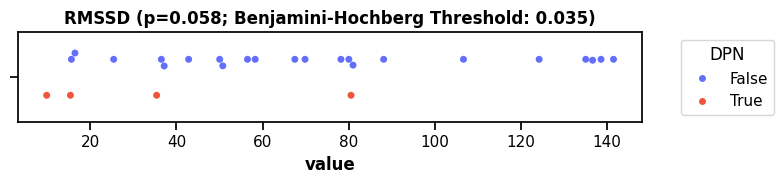

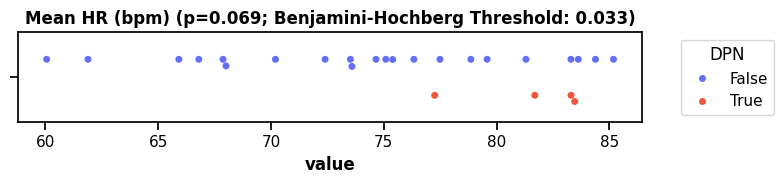

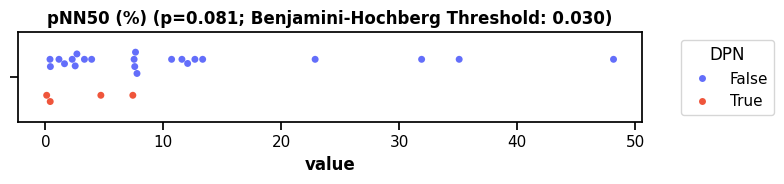

In [59]:
for i, row in result.iterrows():
    if row['p_value']<0.1:
        title = f"{row['metric']} (p={row['p_value']:.3f}; Benjamini-Hochberg Threshold: {row['BH_threshold']:.3f})"
        plt.figure(figsize=(8, 2))
        plt.title(title)
        sns.swarmplot(
            data=median_melted[median_melted['metric'] == row['metric']],  
            hue = 'DPN',
            x='value',
            dodge=True
        )
        # Move legend outside the plot
        plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left', title='DPN')
        plt.tight_layout()

# MEDIAN ABSOLUTE DEVIATION

In [60]:
import plotly.express as px

def bolden(text):
    return f"<b>{text}</b>"

title = bolden("Median SDRR per Patient (p=0.032; α=0.043)")
fig = px.strip(median_melted[median_melted.metric=='SDRR'], x="DPN", y="value", color="DPN", title=title)
fig.update_traces(marker=dict(size=11, line=dict(width=2, color='black')))
fig.update_traces(jitter=0.8)

fig.for_each_trace(lambda t: t.update(name='Control' if t.name == 'False' else 'DPN'))

axis_font = {'size': 16, 'family': 'Arial', 'color': 'black'}
fig.update_layout(
    title={'text': title, 'x': 0.5, 'xanchor': 'center', 'font': {'size': 20, 'family': 'Arial', 'color': 'black'}},
    xaxis_title={'text': bolden('Condition'), 'font': axis_font},
    yaxis_title={'text': bolden('SDRR (ms)'), 'font': axis_font},
    font=dict(family="Arial", size=16, color="black"),
    width=500, height = 400,
    margin=dict(l=20, r=20, t=70, b=20),
    legend=dict(title='Condition', x=0.99, y=0.99, xanchor='right', yanchor='top'),
    xaxis=dict(
        tickmode='array',
        tickvals=[False, True],
        ticktext=['Control (Diabetes)', 'Diabetic Peripheral Neuropathy']
    )
)

fig.update_layout(showlegend=False)
fig.write_image("high_quality_plot.png", format='png', scale=6)


fig.show()

In [61]:
title = bolden("SDRR Distribution per Patient for Control and DPN")
data['id'] = data.id.astype(str)

fig = px.box(data, x='id', y="SDRR", color="DPN", title=title)
#fig.update_traces(marker=dict(size=11, line=dict(width=1, color='black')))
fig.update_traces(jitter=0.8)

fig.for_each_trace(lambda t: t.update(name='Control' if t.name == 'False' else 'DPN'))

axis_font = {'size': 16, 'family': 'Arial', 'color': 'black'}
fig.update_layout(
    title={'text': title, 'x': 0.5, 'xanchor': 'center', 'font': {'size': 20, 'family': 'Arial', 'color': 'black'}},
    xaxis_title={'text': bolden('Patient id'), 'font': axis_font},
    yaxis_title={'text': bolden('SDRR (ms)'), 'font': axis_font},
    font=dict(family="Arial", size=16, color="black"),

    width=600, height = 600,

    margin=dict(l=20, r=20, t=40, b=20),
    legend=dict(title='Condition', x=0.99, y=0.99, xanchor='right', yanchor='top'),

)


#fig.update_layout(showlegend=False)
fig.write_image("messy_plot.png", format='png', scale=6)


fig.show()

In [ ]:
def normalize_melt(df):
    for metric in df["metric"].unique():
        mask = df["metric"]==metric
        values = df[df["metric"]==metric]["value"]
        df.loc[mask, "value"] = values / values.max()

    return df


def plot_normalized(df, title=None, figsize=(8, 15)):
    plt.figure(figsize=figsize)
    sns.swarmplot(data=df, y='metric', x='value', hue = 'DPN', size=4)
    plt.title(title)
    plt.show()

In [63]:
# Mad values
import scipy.stats as stats
import numpy as np


mad=data.groupby(["id", 'DPN'])[indicator_columns].agg(stats.median_abs_deviation)
mad_melt = mad.reset_index().melt(id_vars=["id", 'DPN'], value_vars=indicator_columns, var_name='metric', value_name = 'value')
display(mad_melt)

,id,DPN,metric,value
0,0,False,SDRR,20.41
1,11,False,SDRR,59.12
2,12,False,SDRR,10.03
3,14,False,SDRR,41.71
4,15,False,SDRR,31.93
...,...,...,...,...
515,39,True,D2,NaN
516,4,False,D2,NaN
517,40,True,D2,NaN
518,5,False,D2,NaN


In [64]:
test = CMT.CorrectedMultivariableTest(
    data=mad_melt, 
    group_col='metric',
    value_col='value',
    cat_col='DPN',
    cat_val_1=False,
    cat_val_2=True
)


result = test.perform_ManWhitney_U_tests()
result.sort_values('p_value', inplace=True)
display(result)
result.reset_index(inplace=True, drop=False)

,U_statistic,p_value,significant,rank,BH_threshold,BH_Significant
metric,,,,,,
SampEn,14,0.0322,True,19,0.0475,True
DFA α1,17,0.0577,False,18,0.045,False
ApEn,18,0.0689,False,17,0.0425,False
LF Peak Frequency,19,0.0815,False,16,0.04,False
VLF Peak Frequency,20,0.0959,False,14,0.035,False
S,68,0.0959,False,15,0.0375,False
DFA α2,23,0.15,False,13,0.0325,False
SD2,65,0.15,False,12,0.03,False
SDRR,64,0.17,False,11,0.0275,False


In [65]:
to_plot = [x for x in time_metrics if x != "S"]
figsize = (8, 5)
plot_normalized(normalize_melt(mad_melt[mad_melt["metric"].isin(to_plot )]), "Normalized Median Absolute Deviation Distribution", figsize)
#plot_normalized(normalize_melt(median_melted[median_melted["metric"].isin(to_plot )]), "Normalized Median Distribution", figsize)

KeyError: "None of [Index(['0', '11', '12', '14', '15', '21', '22', '23', '24', '25', '26', '27',\n       '28', '29', '3', '30', '31', '33', '35', '37', '38', '39', '4', '40',\n       '5', '7'],\n      dtype='object', name='id')] are in the [index]"

c:\Users\326po\AppData\Local\Programs\Python\Python311\Lib\site-packages\seaborn\categorical.py:3399: UserWarning:

73.1% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.



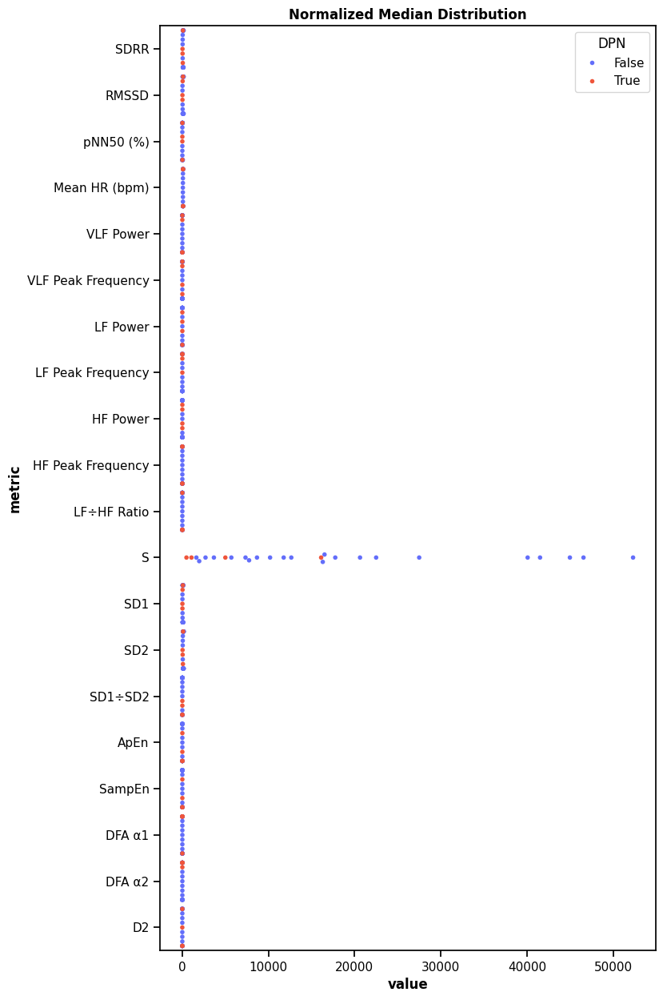

In [ ]:
plot_normalized(normalize_melt(median_melted), "Normalized Median Distribution")

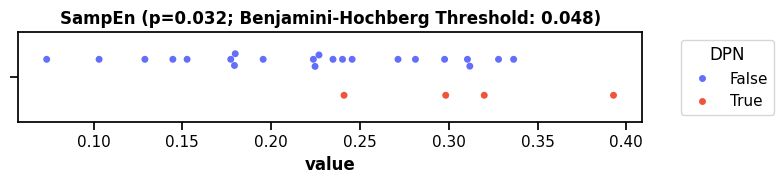

In [ ]:
for i, row in result.iterrows():
    if  row["metric"]=="SampEn":
        title = f"{row['metric']} (p={row['p_value']:.3f}; Benjamini-Hochberg Threshold: {row['BH_threshold']:.3f})"
        plt.figure(figsize=(8, 2))
        plt.title(title)
        sns.swarmplot(
            data=mad_melt[mad_melt['metric'] == row['metric']],  
            hue = 'DPN',
            x='value',
            dodge=True
        )
        # Move legend outside the plot
        plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left', title='DPN')
        plt.tight_layout()

# Permutations test

In [ ]:
stats.permutation_test

<function scipy.stats._resampling.permutation_test(data, statistic, *, permutation_type='independent', vectorized=None, n_resamples=9999, batch=None, alternative='two-sided', axis=0, rng=None)>

In [ ]:
importlib.reload(CMT)
import numpy as np

test = CMT.CorrectedMultivariableTest(
    data=median_melted, 
    group_col='metric',
    value_col='value',
    cat_col='DPN',
    cat_val_1=False,
    cat_val_2=True
)

def statistic(x, y, axis):
    return np.median(x, axis=axis) - np.mean(y, axis=axis)

result = test.permutation_test(statistic, n_permutations=1000)
result.sort_values('p_value', inplace=True)
result.drop(columns=["distribution"], inplace=True)
display(result)


,perm_statistic,p_value,significant,rank,BH_threshold,BH_Significant
metric,,,,,,
SDRR,35.86,0.00799,True,20,0.05,True
HF Power,0.000197,0.022,True,19,0.0475,True
SD2,43.72,0.03,True,18,0.045,True
Mean HR (bpm),-6.56,0.042,True,17,0.0425,True
LF Power,1.19e-05,0.0559,False,16,0.04,False
DFA α2,-0.17,0.0839,False,15,0.0375,False
SD1,23.60,0.0919,False,14,0.035,False
RMSSD,33.38,0.11,False,13,0.0325,False
pNN50 (%),4.45,0.11,False,12,0.03,False


In [ ]:
#plot_normalized(normalize_melt(median_melted), "Normalized Median Distribution")

# Deciles approach
Goal: Confirm that the statistical significance gotten from whole dataset median is not just a lucky shot in the dark.

We first assign appropriate decile value for each metric by patient

In [ ]:
for column in indicator_columns:  
    data = deciles.make_decile_column(data, column)
data.tail(3)

,t_start,t_end,SDRR,RMSSD,pNN50 (%),Mean HR (bpm),ULF Power,ULF Peak Frequency,ULF Peak Power,VLF Power,...,LF÷HF Ratio_decile,S_decile,SD1_decile,SD2_decile,SD1÷SD2_decile,ApEn_decile,SampEn_decile,DFA α1_decile,DFA α2_decile,D2_decile
3252,21010,21610,38.71,41.98,27.34,75.71,1.28e-09,0.00167,1.49e-06,3.11e-06,...,0,4,5,2,7,8,9,2,2,NaN
3253,34218,34818,88.51,31.71,12.61,79.37,1.33e-08,0.00167,1.59e-05,3.19e-06,...,5,6,4,6,0,3,3,6,7,6
3254,76304,76903,173.75,220.18,22.22,74.74,3.17e-09,0.00167,3.57e-06,1.2e-06,...,0,9,9,9,8,0,0,2,7,9


In [ ]:
data.sort_values(by=['DPN', 'id'], inplace=True)
deciles.draw_by_decile(data, "Mean HR (bpm)")

In [ ]:


def agg_metric_deciles(data, metric_column, aggfunc="median"):
    """Uses prepared metric decile to aggregates each metric by it"""
    decile_agg_data = data.groupby(["DPN", "id", f"{metric_column}_decile"]).agg(
        {metric_column: aggfunc}
    )
    decile_agg_data = decile_agg_data.reset_index()
    decile_agg_data = decile_agg_data.rename(columns={metric_column: "Value", f"{metric_column}_decile": "Decile"})
    return decile_agg_data



def pivot_metric_decile(data, metric_column, aggfunc='median'):
    """Calculates the deciles and aggregates each metric by it"""
    data = deciles.make_decile_column(data, metric_column)
    decile_agg_data = agg_metric_deciles(data, metric_column, aggfunc)
    pivot = pd.pivot_table(decile_agg_data, values='Value', index='id', columns='Decile', aggfunc=aggfunc)
    pivot = pivot.join(data[['id', 'DPN']].drop_duplicates().set_index('id'))
    display(pivot)
    return pivot


In [ ]:
channels = pd.DataFrame()
for column in indicator_columns:
    agg_decile = agg_metric_deciles(data, column)

    test = CMT.CorrectedMultivariableTest(
        data=agg_decile,
        group_col="Decile",
        value_col="Value",
        cat_col="DPN",
        cat_val_1=False,
        cat_val_2=True,
    )

    t_result = test.permutation_test(statistic, n_permutations=1000)
    t_result.reset_index(drop=False, inplace=True)
    t_result.insert(0, "metric", column)

    channels = pd.concat([channels, t_result])
channels = channels.reset_index(drop=True)
channels.tail(3)

,metric,Decile,distribution,perm_statistic,p_value,significant,rank,BH_threshold,BH_Significant
197,D2,7,"[0.13069021033197092, 0.5146753409360052, -0.1...",0.11,0.85,False,1,0.005,False
198,D2,8,"[0.033398464578731746, -0.3987497228236838, 0....",-0.0596,0.76,False,4,0.02,False
199,D2,9,"[0.4980327240563802, 0.07169183034171, 0.33797...",0.17,0.81,False,2,0.01,False


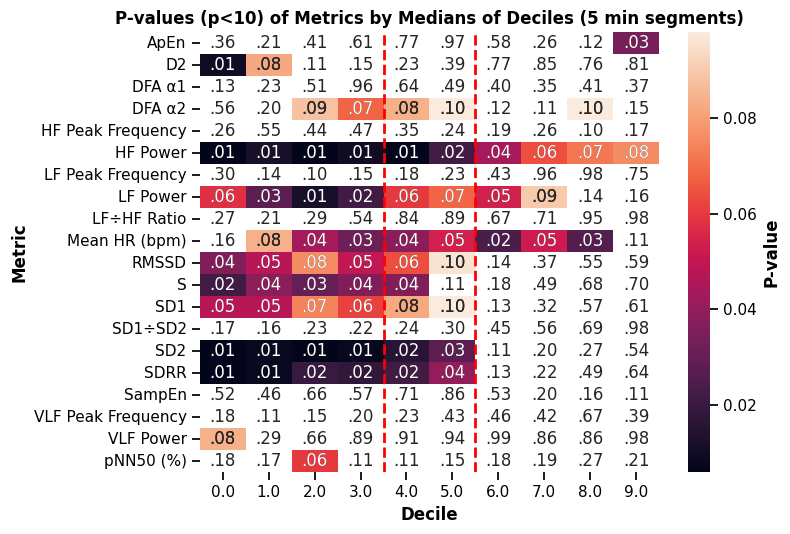

In [ ]:
import numpy as np
from matplotlib.colors import ListedColormap

channel_pivot = pd.pivot_table(
    channels, values="p_value", index="metric", columns="Decile"
)

plt.figure(figsize=(8, 5.5))
white_cmap = ListedColormap(["white"])

ax1 = sns.heatmap(channel_pivot, cmap=white_cmap, cbar=False, annot=True, fmt=".2f")
ax2 = sns.heatmap(
    channel_pivot[channel_pivot<0.1], cmap="rocket", annot=True, fmt=".2f", cbar_kws={"label": "P-value"}
)

for ax in [ax1, ax2]:
    if ax is None:
        continue
    for text in ax.texts:
        current_text = text.get_text()

        if current_text.startswith("0"):
            text.set_text(current_text[1:])

plt.axvline(x=4, color="red", linestyle="--", linewidth=2)
plt.axvline(x=6, color="red", linestyle="--", linewidth=2)


plt.title("P-values (p<10) of Metrics by Medians of Deciles"+title_addon)
plt.xlabel("Decile")
plt.ylabel("Metric")
plt.tight_layout()

In [ ]:
channels = channels[channels.p_value < 0.1].iloc[:,].reset_index(drop=True)

print(
    "Total promissing channels: ",
    channels.shape[0],
    "from ",
    len(indicator_columns) * 10,
)
display(channels)

Total promissing channels:  65 from  200


,metric,Decile,distribution,perm_statistic,p_value,significant,rank,BH_threshold,BH_Significant
0,SDRR,0,"[2.112112108118943, 7.213886927938141, 0.17089...",14.96,0.00599,True,10,0.05,True
1,SDRR,1,"[-22.04990184986267, -12.953887732338643, 4.47...",18.96,0.00799,True,9,0.045,True
2,SDRR,2,"[-3.90664041762912, -18.75956711435608, -14.16...",21.76,0.02,True,7,0.035,True
3,SDRR,3,"[-21.015966822034834, -15.983260940230664, 15....",27.73,0.018,True,8,0.04,True
4,SDRR,4,"[-29.076735956601695, -17.421699707913355, 18....",34.77,0.022,True,6,0.03,True
...,...,...,...,...,...,...,...,...,...
60,DFA α2,4,"[-0.08852840745087054, 0.05493258195920259, 0....",-0.15,0.0839,False,9,0.045,False
61,DFA α2,5,"[-0.031908733103375164, -0.10949408072962608, ...",-0.15,0.0979,False,6,0.03,False
62,DFA α2,8,"[-0.09663985590189905, 0.09557050564832381, -0...",-0.13,0.0979,False,7,0.035,False
63,D2,0,"[-0.31174921705854874, 0.5924699977228922, -0....",5.81,0.00999,True,10,0.05,True


# Heart rate as invariant metric.
Since HR is determined by individuals activity and bodily state and HRV is determined on five minute intervals it should be a good metric to compare others against.

First we discard any unrealistic HR values

In [ ]:
data = data[data["Mean HR (bpm)"]>45]

In [ ]:
title = f"HR (bpm) in Diabetic peripheral neuropathy patients"
plotter = OverallDetailComparisonPlot(
    data=data, 
    x_column="id",
    y_column="Mean HR (bpm)",
    hue_column="DPN",
    detail_mode="box",
    points='all',
    title=title)
plotter.show()

There is a lot of variance in heartbeat between each individual.

In [ ]:
display(data)

,t_start,t_end,SDRR,RMSSD,pNN50 (%),Mean HR (bpm),ULF Power,ULF Peak Frequency,ULF Peak Power,VLF Power,...,LF÷HF Ratio_decile,S_decile,SD1_decile,SD2_decile,SD1÷SD2_decile,ApEn_decile,SampEn_decile,DFA α1_decile,DFA α2_decile,D2_decile
0,0.76,600.40,59.95,50.34,4.16,81.75,2.81e-09,0,1.97e-06,2.23e-06,...,9,1,2,2,3,7,7,8,4,NaN
1707,33024,33623,111.81,97.21,20.65,61.55,3.43e-09,0.00167,3.5e-06,4.1e-06,...,2,7,6,8,3,3,4,6,9,7
1708,32423,33023,73.34,107.40,28.18,58.89,4.93e-08,0,4.35e-05,5.37e-07,...,0,4,8,1,9,6,7,0,1,2
1709,31823,32422,123.29,129.77,22.53,60.90,1.5e-08,0.00167,1.78e-05,4.43e-06,...,1,9,9,8,6,1,2,1,7,8
1710,31222,31822,50.69,54.19,20.21,57.46,1.78e-10,0.00167,1.79e-07,5.58e-06,...,1,1,2,0,7,9,9,4,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3249,22812,23412,44.77,26.04,4.24,80.28,3.24e-08,0.00167,3.17e-05,3.82e-06,...,4,3,3,4,2,5,5,5,6,1
3250,22212,22812,30.89,24.63,3.13,79.80,2.35e-08,0,1.61e-05,4.24e-06,...,4,2,3,1,5,9,9,6,5,NaN
3251,21611,22211,40.47,34.10,13.03,77.50,1.07e-08,0,9.96e-06,2.39e-06,...,2,4,4,3,5,9,8,4,7,1
3252,21010,21610,38.71,41.98,27.34,75.71,1.28e-09,0.00167,1.49e-06,3.11e-06,...,0,4,5,2,7,8,9,2,2,NaN


In [ ]:
import general_utils.utils as u


data["Mean HR (bpm)"] = data["Mean HR (bpm)"].astype(float)
decile = data
decile['Decile'] = decile.groupby('id')["Mean HR (bpm)"].transform(lambda x: pd.qcut(x, 10, labels=False))

decile.head()

,t_start,t_end,SDRR,RMSSD,pNN50 (%),Mean HR (bpm),ULF Power,ULF Peak Frequency,ULF Peak Power,VLF Power,...,S_decile,SD1_decile,SD2_decile,SD1÷SD2_decile,ApEn_decile,SampEn_decile,DFA α1_decile,DFA α2_decile,D2_decile,Decile
0,0.76,600.40,59.95,50.34,4.16,81.75,2.81e-09,0,1.97e-06,2.23e-06,...,1,2,2,3,7,7,8,4,NaN,8
1707,33024,33623,111.81,97.21,20.65,61.55,3.43e-09,0.00167,3.5e-06,4.1e-06,...,7,6,8,3,3,4,6,9,7,3
1708,32423,33023,73.34,107.40,28.18,58.89,4.93e-08,0,4.35e-05,5.37e-07,...,4,8,1,9,6,7,0,1,2,2
1709,31823,32422,123.29,129.77,22.53,60.90,1.5e-08,0.00167,1.78e-05,4.43e-06,...,9,9,8,6,1,2,1,7,8,3
1710,31222,31822,50.69,54.19,20.21,57.46,1.78e-10,0.00167,1.79e-07,5.58e-06,...,1,2,0,7,9,9,4,0,0,2


Check whether the decile is correctly calculated

In [ ]:
title = "Deciles of Mean HR (bpm) in PDR patients"
plotter = OverallDetailComparisonPlot(data=decile, 
                    x_column="id",
                    y_column="Mean HR (bpm)",
                    hue_column="Decile",
                    title=title,
                    category_orders={"Decile": [0, 1, 2, 3, 4, 5, 6, 7, 8, 9]},
                    detail_mode="strip")

plotter.setup_general_layout(ratio=1/5)
                    
plotter.show()

In [ ]:
df_decile = decile[~decile.Decile.isin([0, 9])]
df_decile = df_decile[df_decile['SDRR'] <= 1000]
df_decile = df_decile[df_decile['RMSSD'] <= 1000]

Bellow are the results we got without discarding the 0th and 9th decile in Heart rate (BPM)

Now we compar the spread ratios